# Load data

In [1]:
import warnings; warnings.filterwarnings("ignore") # remove scanpy warnings for the tutorial.

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import scanpy as sc 

In [3]:
import matplotlib
print(matplotlib.__version__)
import IPython
print(IPython.__version__)

3.7.5
8.37.0


In [5]:
color_palette = None
path = '/Users/jihyunpark/Documents/Columbia/2026 Spring/Decipher Project/xenium_exploration/20260207_adata_preprocessed_full.h5ad'
adata = sc.read_h5ad(path)
adata.uns["color_palette"] = None

In [6]:
print(adata.obs['batch'].unique())

['0', '1']
Categories (2, object): ['0', '1']


In [7]:
print(adata.obs['sample_type'].value_counts())

sample_type
tumor     436005
margin    259255
Name: count, dtype: int64


In [8]:
import pandas as pd
pd.crosstab(adata.obs['TMA'], adata.obs['batch'])

batch,0,1
TMA,,
479,0,403192
480,292068,0


In [36]:
cols_to_fix = ['biopsy_site_classification (0 = unkwn; 1 = head and neck; 2 = thoracic; 3 = non-head and neck or thoracic; 4 = LN)',
       'sample site: primary vs met',
       'primary site classification (0 = unkwn; 1 = head and neck; 2 = thoracic; 3 = non-head and neck or thoracic)',
       'NUT-fusion: 0 = unkwn; 1 = BRD4-NUT; 2 = BRD3-NUT; 3 = NSD3-NUT; 4 = ZNF532-NUT; 5 = ZNF592-NUT',
       'treatment_(0= no treatment before biopsy; 1=treatment before biopsy)',
       'TMA_ID','batch','TMA',
       'sample_id',
       'PDL1: 0 = <1%; 1 = >=1%',
       'cell_num',
       'cluster'
       ]

for col in cols_to_fix:
    adata.obs[col] = adata.obs[col].astype('category')

In [37]:
# Gives a breakdown of memory usage, non-null counts, and dtypes
adata.obs.info()

<class 'pandas.core.frame.DataFrame'>
Index: 695260 entries, 0 to 831612
Data columns (total 48 columns):
 #   Column                                                                                                              Non-Null Count   Dtype   
---  ------                                                                                                              --------------   -----   
 0   centroid_x                                                                                                          695260 non-null  float64 
 1   centroid_y                                                                                                          695260 non-null  float64 
 2   centroid_z                                                                                                          695260 non-null  float64 
 3   fov                                                                                                                 695260 non-null  category
 4   cluster

In [38]:
# Returns a DataFrame containing only the categorical columns
categorical_obs = adata.obs.select_dtypes(include=['category'])

print(categorical_obs.head())

# Get a list of the column names
cat_columns = adata.obs.select_dtypes(include=['category']).columns.tolist()

print(cat_columns)

    fov cluster  cell_num      sample_id sample_type  TMA batch leiden  \
0  AD13       6  cell_0_1    S16-2647 B2      margin  480     0      7   
1   AD5       5  cell_1_1    BA12-166 A2       tumor  480     0      0   
2   I10       6  cell_3_1   S14-81178 7A       tumor  480     0     33   
3    S8       5  cell_5_1  S15-105098 B1       tumor  480     0     15   
5    S8       9  cell_7_1  S15-105098 B1       tumor  480     0      0   

  density_status atypical  ... treatment_status  OS_cat    sample_name  \
0   high_density    False  ...        untreated     low    S16-2647 B2   
1   high_density    False  ...          treated     low    BA12-166 A2   
2   high_density    False  ...        untreated  medium   S14-81178 7A   
3   high_density    False  ...        untreated    high  S15-105098 B1   
5   high_density    False  ...        untreated    high  S15-105098 B1   

    ex_group cell_type_L2 cell_type_L1 cell_type_L0 cell_type_general  \
0  inflammed        tumor        tumo

In [39]:
for col in adata.obs.select_dtypes(include=['category']).columns:
    n_cats = len(adata.obs[col].cat.categories)
    print(f"{col}: {n_cats} categories")
    print(f"  Examples: {list(adata.obs[col].cat.categories[:5])}\n")

fov: 500 categories
  Examples: ['A9', 'A10', 'A12', 'A14', 'A15']

cluster: 10 categories
  Examples: [0, 1, 2, 3, 4]

cell_num: 695260 categories
  Examples: ['cell_0_1', 'cell_0_2', 'cell_100000_1', 'cell_100000_2', 'cell_100001_2']

sample_id: 53 categories
  Examples: ['10-6031', '10-I-010822 A6', '10AH 4757 D', '20:LP043462 D', '2151/06']

sample_type: 2 categories
  Examples: ['margin', 'tumor']

TMA: 2 categories
  Examples: [479, 480]

batch: 2 categories
  Examples: ['0', '1']

leiden: 43 categories
  Examples: ['0', '1', '2', '3', '4']

density_status: 2 categories
  Examples: ['high_density', 'low_density']

atypical: 1 categories
  Examples: [False]

cell_type: 25 categories
  Examples: ['CD4 Tfh', 'CD4 Th 1', 'CD4 Th 17', 'CD8 T cm', 'CD8 T effector']

TMA_ID: 53 categories
  Examples: [2, 3, 4, 5, 6]

treatment_(0= no treatment before biopsy; 1=treatment before biopsy): 5 categories
  Examples: ['0', '1', 'unknown (date of biopsy not known)', 'unknown (date of treatment 

'biopsy_site_classification (0 = unkwn; 1 = head and neck; 2 = thoracic; 3 = non-head and neck or thoracic; 4 = LN)',
       'sample site: primary vs met',
       'primary site classification (0 = unkwn; 1 = head and neck; 2 = thoracic; 3 = non-head and neck or thoracic)',
       'NUT-fusion: 0 = unkwn; 1 = BRD4-NUT; 2 = BRD3-NUT; 3 = NSD3-NUT; 4 = ZNF532-NUT; 5 = ZNF592-NUT',
       'treatment_(0= no treatment before biopsy; 1=treatment before biopsy)',
       'TMA_ID','batch','TMA',
       'sample_id',
       'PDL1: 0 = <1%; 1 = >=1%',

In [41]:
# Rename specific columns
adata.obs = adata.obs.rename(columns={
    'biopsy_site_classification (0 = unkwn; 1 = head and neck; 2 = thoracic; 3 = non-head and neck or thoracic; 4 = LN)' : 'biopsy_site_classification',
    'sample site: primary vs met': 'sample_site',
    'primary site classification (0 = unkwn; 1 = head and neck; 2 = thoracic; 3 = non-head and neck or thoracic)': 'primary site classification',
    'NUT-fusion: 0 = unkwn; 1 = BRD4-NUT; 2 = BRD3-NUT; 3 = NSD3-NUT; 4 = ZNF532-NUT; 5 = ZNF592-NUT': 'NUT-fusion',
    'treatment_(0= no treatment before biopsy; 1=treatment before biopsy)': 'treatment',
    'PDL1: 0 = <1%; 1 = >=1%': 'PDL1'  
})

In [42]:
adata.obs.info()

<class 'pandas.core.frame.DataFrame'>
Index: 695260 entries, 0 to 831612
Data columns (total 48 columns):
 #   Column                                Non-Null Count   Dtype   
---  ------                                --------------   -----   
 0   centroid_x                            695260 non-null  float64 
 1   centroid_y                            695260 non-null  float64 
 2   centroid_z                            695260 non-null  float64 
 3   fov                                   695260 non-null  category
 4   cluster                               695260 non-null  category
 5   volume                                695260 non-null  float64 
 6   population                            695260 non-null  int64   
 7   cell_num                              695260 non-null  category
 8   Unnamed: 0                            695260 non-null  int64   
 9   sample_num                            695260 non-null  float64 
 10  sample_id                             695260 non-null  catego

In [ ]:
print(adata.obs['cluster'].categories.tolist())

In [43]:
for col in adata.obs.select_dtypes(include=['category']).columns:
    n_cats = len(adata.obs[col].cat.categories)
    print(f"{col}: {n_cats} categories")
    print(f"  Examples: {list(adata.obs[col].cat.categories[:5])}\n")

fov: 500 categories
  Examples: ['A9', 'A10', 'A12', 'A14', 'A15']

cluster: 10 categories
  Examples: [0, 1, 2, 3, 4]

cell_num: 695260 categories
  Examples: ['cell_0_1', 'cell_0_2', 'cell_100000_1', 'cell_100000_2', 'cell_100001_2']

sample_id: 53 categories
  Examples: ['10-6031', '10-I-010822 A6', '10AH 4757 D', '20:LP043462 D', '2151/06']

sample_type: 2 categories
  Examples: ['margin', 'tumor']

TMA: 2 categories
  Examples: [479, 480]

batch: 2 categories
  Examples: ['0', '1']

leiden: 43 categories
  Examples: ['0', '1', '2', '3', '4']

density_status: 2 categories
  Examples: ['high_density', 'low_density']

atypical: 1 categories
  Examples: [False]

cell_type: 25 categories
  Examples: ['CD4 Tfh', 'CD4 Th 1', 'CD4 Th 17', 'CD8 T cm', 'CD8 T effector']

TMA_ID: 53 categories
  Examples: [2, 3, 4, 5, 6]

treatment: 5 categories
  Examples: ['0', '1', 'unknown (date of biopsy not known)', 'unknown (date of treatment unknown)', 'unknown (not a registry participant)']

biopsy_

In [44]:
adata.write_h5ad("adata_categories_edited.h5ad", compression="gzip")

In [2]:
color_palette = None
path = 'adata_categories_edited.h5ad'
adata = sc.read_h5ad(path)
adata.uns["color_palette"] = None

In [3]:
# 2. Sample 25,000 cells from every group in the 'batch' column
sampled_indices = (
    adata.obs.groupby('batch')
    .sample(n=25000, random_state=42)
    .index
)

# 3. Slice the original AnnData object
adata_balanced = adata[sampled_indices].copy()

# Verification
print(adata_balanced.obs['batch'].value_counts())

batch
0    25000
1    25000
Name: count, dtype: int64


In [16]:
print(adata_balanced.obs['ex_group'].value_counts())

ex_group
excluded     17214
inflammed    14963
desert       14517
Name: count, dtype: int64


In [4]:
adata_batch0 = adata[adata.obs['TMA']==480]
adata_batch1 = adata[adata.obs['TMA']==479]

batch0_subset = sc.pp.subsample(adata_batch0, n_obs=50000, random_state=42, copy=True)
batch1_subset = sc.pp.subsample(adata_batch1, n_obs=50000, random_state=42, copy=True)

In [11]:
print(batch0_subset.layers['counts'][:5, :5])

<Compressed Sparse Row sparse matrix of dtype 'float64'
	with 10 stored elements and shape (5, 5)>
  Coords	Values
  (0, 0)	3.2277427
  (0, 3)	1.1900218
  (1, 3)	23.600454
  (2, 1)	0.0100001
  (2, 0)	1.6100364
  (2, 3)	54.714066
  (3, 3)	2.9387991
  (4, 1)	0.0400004
  (4, 4)	0.3700037
  (4, 3)	1.7000271


If the max is < 20: You are likely looking at Log-normalized data. Do not round. You need to find the actual raw counts layer.

If the max is > 100: You are likely looking at Corrected counts (like CellBender). Rounding is safe and necessary.

In [11]:
print(batch0_subset.layers['counts'].max())

1256.8799


The 'counts' layer contained fractional values, likely due to ambient RNA correction or scaling. I rounded these to the nearest integer to satisfy the integer-count requirement of the Negative Binomial likelihood in our Decipher model.

In [5]:
import scipy.sparse as sp

def round_counts(adata):
    counts = adata.layers['counts'].copy()
    if sp.issparse(counts):
        counts.data = counts.data.round().astype(int)
    else:
        counts = counts.round().astype(int)
    adata.X = counts
    return adata

batch0_subset_dc = round_counts(batch0_subset)
batch1_subset_dc = round_counts(batch1_subset)
adata_balanced_dc = round_counts(adata_balanced)

### Train Decipher

In [ ]:
color_palette = None
adata_tumor_balanced_dc = sc.read_h5ad('adata_tumor_balanced_dc.h5ad')
adata_tumor_balanced_dc.uns["color_palette"] = None

In [6]:
import decipher as dc
dc.pl.activate_journal_quality()

In [7]:
adata_tumor_balanced_dc1 = adata_tumor_balanced_dc.copy()

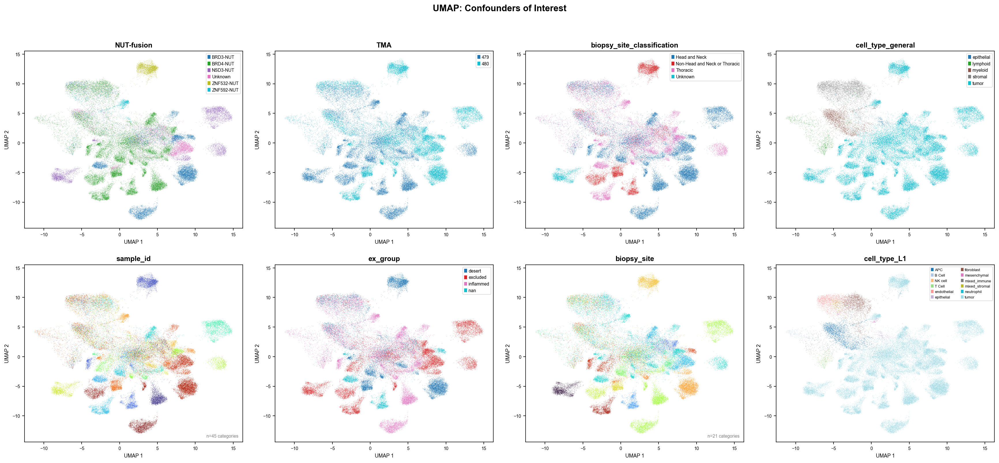

In [13]:
import scanpy as sc
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import numpy as np

# Define the 8 confounders in layout order (2 rows x 4 cols)
confounders = [
    'NUT-fusion', 'TMA', 'biopsy_site_classification', 'cell_type_general',  # Row 1
    'sample_id',  'ex_group', 'biopsy_site', 'cell_type_L1'                  # Row 2
]

# NUT-fusion label mapping (0=unkwn, 1=BRD4-NUT, 2=BRD3-NUT, 3=NSD3-NUT, 4=ZNF532-NUT, 5=ZNF592-NUT)
nut_fusion_labels = {
    0: 'Unknown', 1: 'BRD4-NUT', 2: 'BRD3-NUT',
    3: 'NSD3-NUT', 4: 'ZNF532-NUT', 5: 'ZNF592-NUT'
}

# biopsy_site_classification label mapping (0=unkwn, 1=head and neck, 2=thoracic, 3=non-head and neck or thoracic, 4=LN)
biopsy_site_labels = {
    0: 'Unknown', 1: 'Head and Neck', 2: 'Thoracic',
    3: 'Non-Head and Neck or Thoracic', 4: 'LN'
}

fig, axes = plt.subplots(2, 4, figsize=(22, 10))
axes = axes.flatten()

for i, col in enumerate(confounders):
    ax = axes[i]

    if col not in adata_tumor_balanced_dc.obs.columns:
        ax.set_visible(False)
        continue

    umap_coords = adata_tumor_balanced_dc.obsm['X_umap']
    labels = adata_tumor_balanced_dc.obs[col].values

    # Apply NUT-fusion label mapping if needed
    if col == 'NUT-fusion':
        labels = np.array([nut_fusion_labels.get(int(x), str(x)) for x in labels])
        
    # Apply biopsy_site_classification label mapping if needed
    if col == 'biopsy_site_classification':
        labels = np.array([biopsy_site_labels.get(int(x), str(x)) for x in labels])

    unique_labels = np.unique(labels.astype(str))
    n_cats = len(unique_labels)

    # Choose colormap based on cardinality
    if n_cats <= 10:
        cmap = plt.cm.get_cmap('tab10', n_cats)
    elif n_cats <= 20:
        cmap = plt.cm.get_cmap('tab20', n_cats)
    else:
        cmap = plt.cm.get_cmap('turbo', n_cats)

    label_to_color = {lab: cmap(j) for j, lab in enumerate(unique_labels)}
    colors = [label_to_color[str(l)] for l in labels]

    ax.scatter(
        umap_coords[:, 0], umap_coords[:, 1],
        c=colors, s=0.5, alpha=0.4, linewidths=0, rasterized=True
    )
    ax.set_title(col, fontsize=11, fontweight='bold', pad=6)
    ax.set_xlabel('UMAP 1', fontsize=8)
    ax.set_ylabel('UMAP 2', fontsize=8)
    ax.tick_params(labelsize=7)

    # Add legend only if manageable number of categories
    if n_cats <= 20:
        handles = [
            mpatches.Patch(color=label_to_color[lab], label=lab)
            for lab in unique_labels
        ]
        legend_fontsize = 6 if n_cats > 10 else 7
        ax.legend(
            handles=handles,
            fontsize=legend_fontsize,
            markerscale=1.2,
            loc='best',
            framealpha=0.6,
            ncol=2 if n_cats > 10 else 1
        )
    else:
        ax.text(
            0.98, 0.02, f'n={n_cats} categories',
            transform=ax.transAxes, fontsize=7,
            ha='right', va='bottom', color='gray'
        )

plt.suptitle('UMAP: Confounders of Interest', fontsize=14, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig('umap_confounders.png', dpi=150, bbox_inches='tight')
plt.show()

In [ ]:
def plot_training(adata, color_group, niter):
    from decipher.tools._decipher import DecipherConfig
    for i in range(niter):
        decipher_config = DecipherConfig(learning_rate=1e-3, seed=i)
        # Train Decipher
        d1, val1 = dc.tl.decipher_train(
            adata, decipher_config, plot_kwargs={"color": color_group}, plot_every_k_epochs=5,
        )
        
        dc.tl.decipher_rotate_space(
            adata_balanced_dc,
            v1_col="ex_group",
            v1_order=["desert", "excluded", "inflammed", "NA"],
            v2_col="TMA",
            v2_order=["479", "480"],
        )
        dc.pl.decipher(adata_balanced_dc, ["ex_group", "TMA"], palette=color_palette);
        # Decipher 1: ex_group, Decipher 2: TMA
        adata_balanced_dc.obsm['decipher_v_seed1'] = adata_balanced_dc.obsm['decipher_v'].copy()
                

Epoch 25 (batch 703/703) | | train elbo: 244.63 (last epoch: 244.69) | val ll: 254.47:   2%|▎         | 25/1000 [22:34<14:40:29, 54.18s/it]2026-05-14 00:28:32,379 | INFO : Early stopping has been triggered.
2026-05-14 00:28:33,136 | INFO : Added `.obsm['decipher_v']`: the Decipher v space.
2026-05-14 00:28:33,139 | INFO : Added `.obsm['decipher_z']`: the Decipher z space.
2026-05-14 00:28:33,167 | INFO : Saving decipher model with run_id 2026-05-14-00-28-33-balanced-ivory-salad.


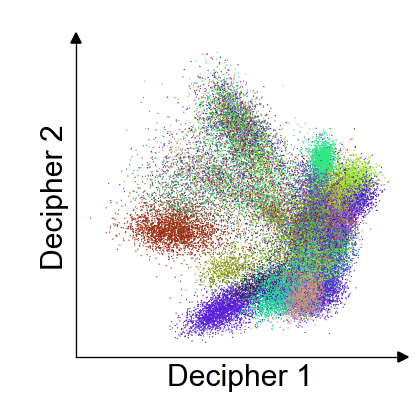

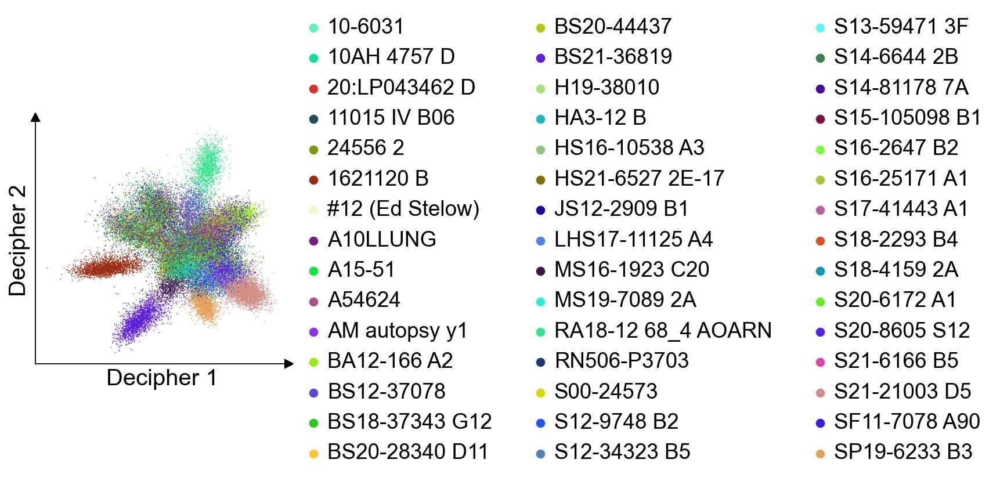

In [9]:
# Lower learning rate
from decipher.tools._decipher import DecipherConfig
decipher_config = DecipherConfig(learning_rate=1e-3, seed=1)

# Train Decipher
d1, val1 = dc.tl.decipher_train(
    adata_tumor_balanced_dc1, decipher_config, plot_kwargs={"color": "sample_id"}, plot_every_k_epochs=5,
)

In [10]:
adata_tumor_balanced_dc1.obsm['decipher_v_seed1'] = adata_tumor_balanced_dc1.obsm['decipher_v'].copy()

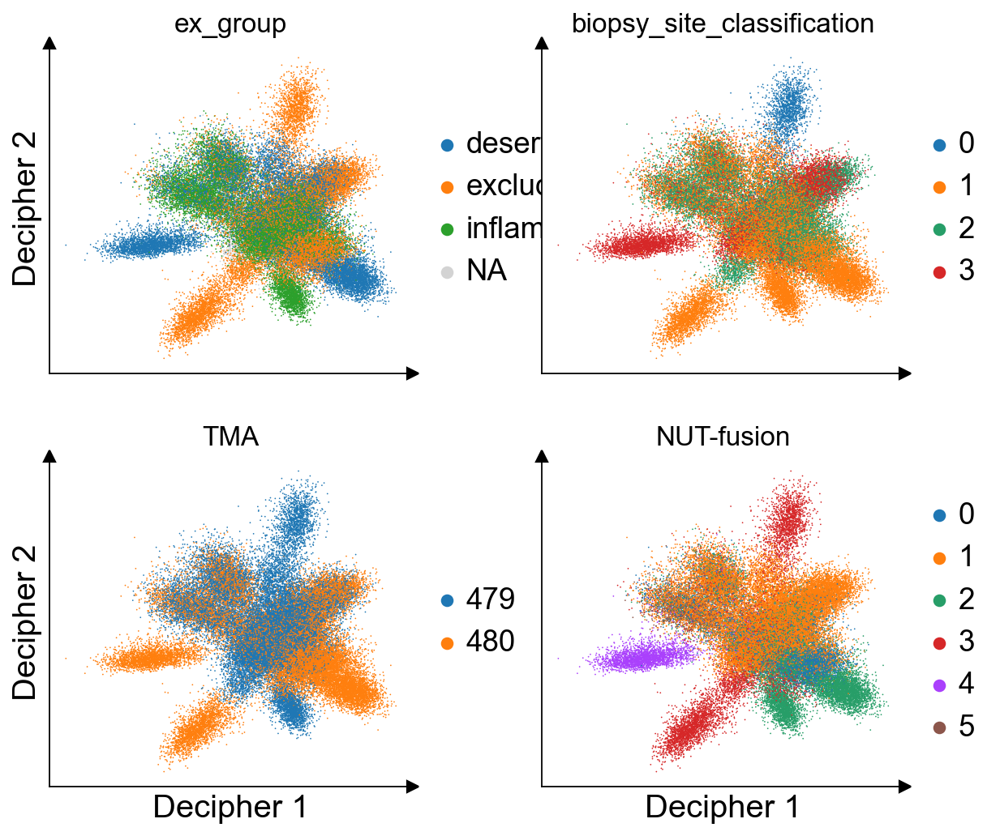

In [11]:
# dc.tl.decipher_rotate_space(
#     adata_tumor_balanced_dc1,
#     v1_col="ex_group",
#     v1_order=["desert", "excluded", "inflammed", "NA"],
#     v2_col="TMA",
#     v2_order=["479", "480"],
# )
plt.rcParams['axes.titlesize'] = 15
dc.pl.decipher(adata_tumor_balanced_dc1, ["ex_group", "biopsy_site_classification", "TMA", "NUT-fusion"], palette=color_palette);

In [14]:
# Before choosing what to correct for, measure which covariates actually drive
# separation in the v-space. High silhouette = strong separation = bigger effect.

from sklearn.metrics import silhouette_score

v = adata_tumor_balanced_dc1.obsm['decipher_v_seed1']

# Only score covariates with at least 2 unique values and no NaNs
covariates_to_score = {
    "TMA"   : adata_tumor_balanced_dc1.obs["TMA"].astype(str),
    "ex_group"    : adata_tumor_balanced_dc1.obs["ex_group"].astype(str),
    "sample_id" : adata_tumor_balanced_dc1.obs["sample_id"].astype(str),
    "NUT-fusion" : adata_tumor_balanced_dc1.obs["NUT-fusion"].astype(str),
    "cell_type_L1": adata_tumor_balanced_dc1.obs["cell_type_L1"].astype(str),
    "cell_type_general": adata_tumor_balanced_dc1.obs["cell_type_general"].astype(str),
    "biopsy_site" : adata_tumor_balanced_dc1.obs["biopsy_site"].astype(str),
    "biopsy_site_classification" : adata_tumor_balanced_dc1.obs["biopsy_site_classification"].astype(str),
}

print("\n── Silhouette scores in v-space (higher = stronger separation) ──────────")
silhouette_results = {}
for name, labels in covariates_to_score.items():
    # Drop NaN rows
    mask = labels != "nan"
    if labels[mask].nunique() < 2:
        print(f"  {name:<20} skipped (< 2 unique values)")
        continue
    score = silhouette_score(v[mask], labels[mask], sample_size=5000, random_state=42)
    silhouette_results[name] = score
    print(f"  {name:<25} silhouette = {score:.4f}")  



── Silhouette scores in v-space (higher = stronger separation) ──────────
  TMA                       silhouette = 0.0597
  ex_group                  silhouette = -0.0114
  sample_id                 silhouette = -0.1905
  NUT-fusion                silhouette = -0.0624
  cell_type_L1              silhouette = -0.2904
  cell_type_general         silhouette = -0.2213
  biopsy_site               silhouette = -0.1986
  biopsy_site_classification silhouette = -0.0052


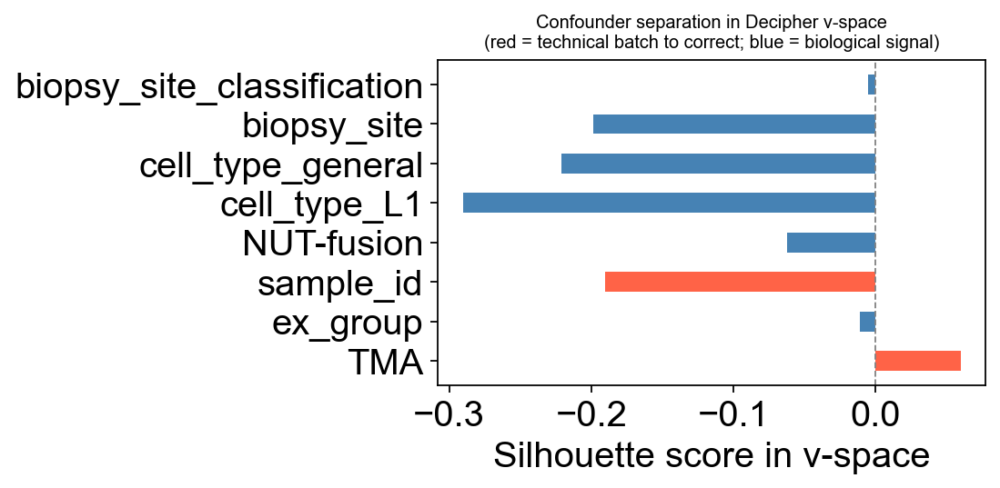

In [15]:
technical = {"TMA", "sample_id"}  # red = technical batch

fig, ax = plt.subplots(figsize=(7, 3.5))
plt.rcParams.update({'font.size': 11})

names  = list(silhouette_results.keys())
scores = list(silhouette_results.values())
colors = ["tomato" if n in technical else "steelblue" for n in names]

bars = ax.barh(names, scores, color=colors, edgecolor="none", height=0.5)
ax.axvline(0, color="gray", linewidth=0.8, linestyle="--")
ax.set_xlabel("Silhouette score in v-space")
ax.set_title("Confounder separation in Decipher v-space\n"
             "(red = technical batch to correct; blue = biological signal)", fontsize=9)
plt.tight_layout()
plt.show()

In [ ]:
adata_combined1 = sc.read_h5ad('simulated_data/concat_adata_may/adata_combined_alpha_0.1_0.3_0.5_0.7_1.0(2).h5ad')
adata_combined3 = sc.read_h5ad('simulated_data/concat_adata_may/adata_combined_alpha_0.3_0.9_1.5_2.1_3.0(2).h5ad')

Epoch 200 (batch 24/24) | | train elbo: 124.53 (last epoch: 124.19) | val ll: 137.46:  20%|██        | 200/1000 [02:58<11:54,  1.12it/s]2026-05-14 02:10:54,905 | INFO : Early stopping has been triggered.
2026-05-14 02:10:54,923 | INFO : Added `.obsm['decipher_v']`: the Decipher v space.
2026-05-14 02:10:54,923 | INFO : Added `.obsm['decipher_z']`: the Decipher z space.
2026-05-14 02:10:54,926 | INFO : Saving decipher model with run_id 2026-05-14-02-10-54-exothermic-canary-prefix.


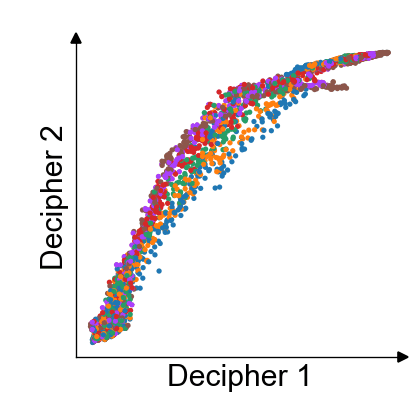

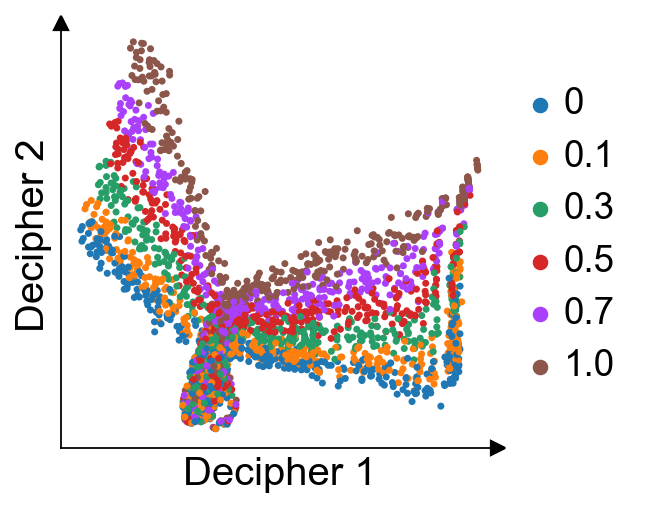

In [34]:
decipher_config = DecipherConfig(learning_rate=1e-3, seed=1)

# Train Decipher
d1, val1 = dc.tl.decipher_train(
    adata_combined1, decipher_config, plot_kwargs= {"color": "shift"}, plot_every_k_epochs=5,
)

In [35]:
import os
folder = "./_decipher_models/"
latest = max(os.listdir(folder), key=lambda x: os.path.getmtime(os.path.join(folder, x)))
print(os.path.join(folder, latest, "decipher_training.gif"))

./_decipher_models/.DS_Store/decipher_training.gif


alpha
0      0.017557
0.1   -0.026238
0.3   -0.053483
0.5   -0.077065
0.7   -0.108930
1.0   -0.114184
Name: silhouette_value, dtype: float32


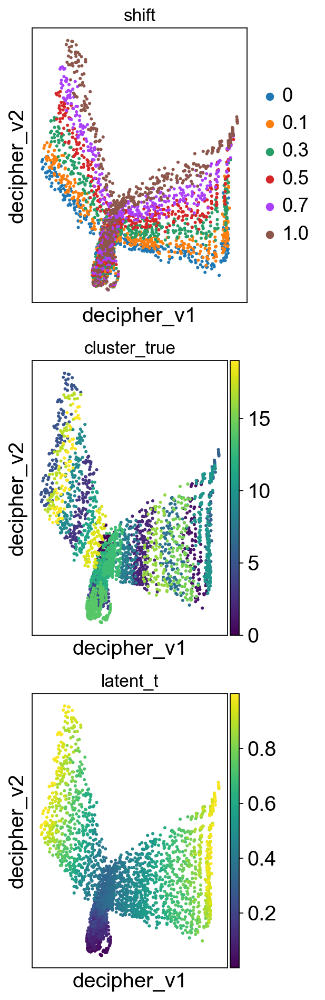

In [36]:
import logging
import pandas as pd
import scanpy as sc
import os
from sklearn.cluster import KMeans

from matplotlib import pyplot as plt
import seaborn as sns

import matplotlib as mpl

import numpy as np
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score
from scipy.sparse.csgraph import minimum_spanning_tree
from sklearn.metrics import silhouette_samples

suffix = "native_alpha_0.1_0.3_0.5_0.7_1.0"

decipher_z = adata_combined1.obsm["decipher_z"]
k_means = KMeans(20)
k_means.fit(decipher_z)
adata_combined1.obs["cluster_latent"] = k_means.labels_

aris = {}
for a in adata_combined1.obs["shift"].unique():
    mask = adata_combined1.obs["shift"] == a
    aris[a] = adjusted_rand_score(
        adata_combined1.obs["cluster_true"][mask],
        adata_combined1.obs["cluster_latent"][mask],
    )
#print(f"[{suffix}] aris values: {aris}")

shift_labels = adata_combined1.obs["shift"]
sil_values = silhouette_samples(decipher_z, shift_labels)
df = pd.DataFrame({"silhouette_value": sil_values, "alpha": shift_labels.values})
print(df.groupby("alpha", observed=True)["silhouette_value"].mean())

fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(4, 3*4))
# sc.pl.embedding(adata_combined1, basis="decipher_v", color="shift",
#                 show=False, ax=axes[0], size=30)
sc.pl.embedding(adata_combined1, basis="decipher_v", color="shift",
                show=False, ax=axes[0], size=30)
sc.pl.embedding(adata_combined1, basis="decipher_v", color="cluster_true",
                show=False, ax=axes[1], size=30)
sc.pl.embedding(adata_combined1, basis="decipher_v", color="latent_t",
                show=False, ax=axes[2], size=30)
plt.tight_layout()
plt.show()

In [37]:
# Before choosing what to correct for, measure which covariates actually drive
# separation in the v-space. High silhouette = strong separation = bigger effect.

from sklearn.metrics import silhouette_score

v = adata_combined1.obsm['decipher_v'].copy()

# Only score covariates with at least 2 unique values and no NaNs
covariates_to_score = {
    "shift"   : adata_combined1.obs["shift"].astype(str),
}

print("\n── Silhouette scores in v-space (higher = stronger separation) ──────────")
silhouette_results = {}
for name, labels in covariates_to_score.items():
    # Drop NaN rows
    mask = labels != "nan"
    if labels[mask].nunique() < 2:
        print(f"  {name:<20} skipped (< 2 unique values)")
        continue
    score = silhouette_score(v[mask], labels[mask], sample_size=5000, random_state=42)
    silhouette_results[name] = score
    print(f"  {name:<25} silhouette = {score:.4f}")  



── Silhouette scores in v-space (higher = stronger separation) ──────────
  shift                     silhouette = -0.0402


In [ ]:
suffix = "native_alpha_0.3_0.9_1.5_2.1_3.0.h5ad"

decipher_z = adata_combined3.obsm["decipher_z"]
k_means = KMeans(20)
k_means.fit(decipher_z)
adata_combined3.obs["cluster_latent"] = k_means.labels_

aris = {}
for a in adata_combined3.obs["shift"].unique():
    mask = adata_combined3.obs["shift"] == a
    aris[a] = adjusted_rand_score(
        adata_combined3.obs["cluster_true"][mask],
        adata_combined3.obs["cluster_latent"][mask],
    )
#print(f"[{suffix}] aris values: {aris}")

shift_labels = adata_combined3.obs["shift"]
sil_values = silhouette_samples(decipher_z, shift_labels)
df = pd.DataFrame({"silhouette_value": sil_values, "alpha": shift_labels.values})
print(df.groupby("alpha", observed=True)["silhouette_value"].mean())

fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(4, 3*4))
# sc.pl.embedding(adata_combined3, basis="decipher_v", color="shift",
#                 show=False, ax=axes[0], size=30)
sc.pl.embedding(adata_combined3, basis="decipher_v", color="shift",
                show=False, ax=axes[0], size=30)
sc.pl.embedding(adata_combined3, basis="decipher_v", color="cluster_true",
                show=False, ax=axes[1], size=30)
sc.pl.embedding(adata_combined3, basis="decipher_v", color="latent_t",
                show=False, ax=axes[2], size=30)
plt.tight_layout()
plt.show()

Epoch 32 (batch 703/703) | | train elbo: 240.00 (last epoch: 239.96) | val ll: 250.39:   3%|▎         | 32/1000 [14:01<7:04:26, 26.31s/it]2026-05-08 00:52:35,290 | INFO : Early stopping has been triggered.
2026-05-08 00:52:35,880 | INFO : Added `.obsm['decipher_v']`: the Decipher v space.
2026-05-08 00:52:35,881 | INFO : Added `.obsm['decipher_z']`: the Decipher z space.
2026-05-08 00:52:35,885 | INFO : Saving decipher model with run_id 2026-05-08-00-52-35-cold-blue-liquor.


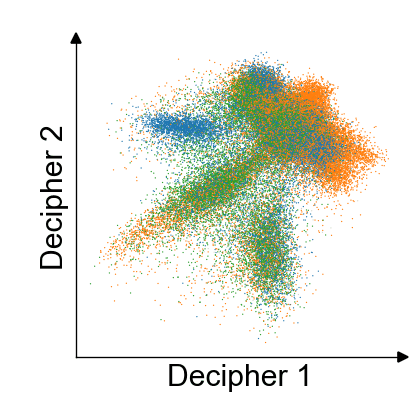

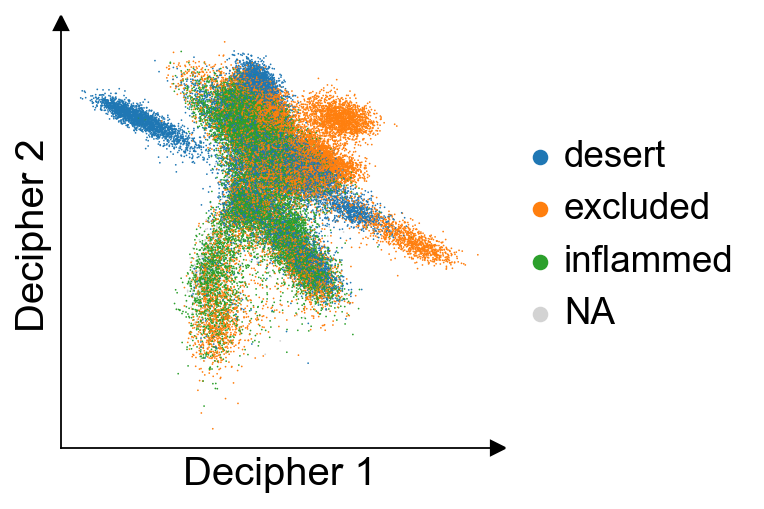

In [61]:
# Lower learning rate
from decipher.tools._decipher import DecipherConfig
decipher_config2 = DecipherConfig(learning_rate=1e-3, seed=2)

# Train Decipher
d2, val2 = dc.tl.decipher_train(
    adata_balanced_dc, decipher_config2, plot_kwargs={"color": "ex_group"}, plot_every_k_epochs=5,
)
adata_balanced_dc.obsm['decipher_v_seed2'] = adata_balanced_dc.obsm['decipher_v'].copy()

2026-05-08 00:52:47,580 | INFO : Added `.obsm['decipher_v']`: the Decipher v space.
2026-05-08 00:52:47,581 | INFO : Added `.obsm['decipher_z']`: the Decipher z space.


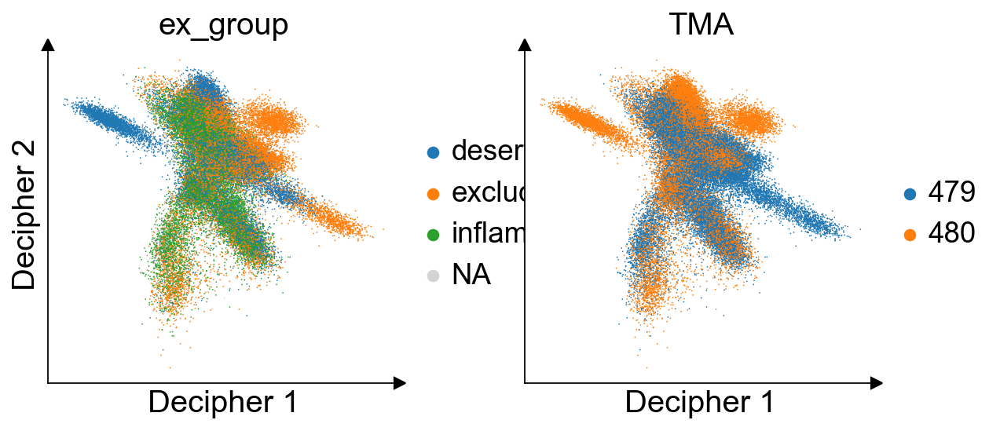

In [62]:
dc.tl.decipher_rotate_space(
    adata_balanced_dc,
    v1_col="ex_group",
    v1_order=["desert", "excluded", "inflammed", "NA"],
    v2_col="TMA",
    v2_order=["479", "480"],
)
dc.pl.decipher(adata_balanced_dc, ["ex_group", "TMA"], palette=color_palette);
# Decipher 1: ex_group, Decipher 2: TMA

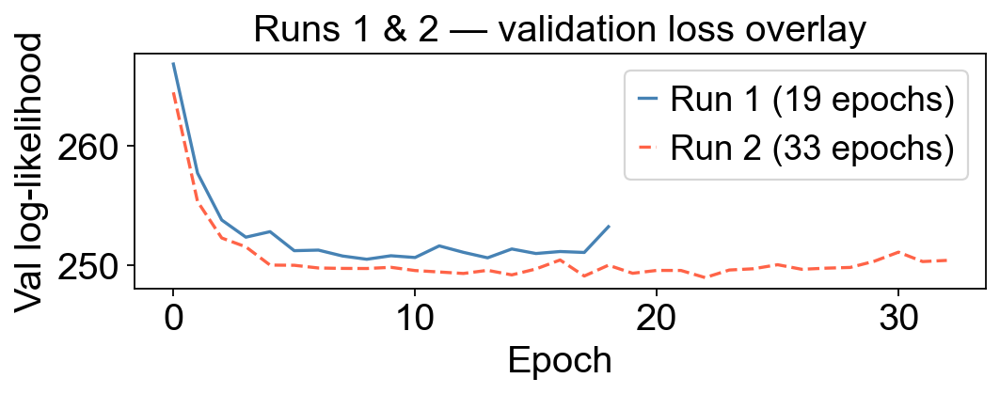

In [63]:
run1 = adata_balanced_dc.obsm['decipher_v_seed1']
run2 = adata_balanced_dc.obsm['decipher_v_seed2']

n_epochs_run1 = len(val1)
n_epochs_run2 = len(val2)

fig, ax = plt.subplots(figsize=(7, 3))
ax.plot(val1, color="steelblue", linewidth=1.5, label=f"Run 1 ({n_epochs_run1} epochs)")
ax.plot(val2, color="tomato",    linewidth=1.5, label=f"Run 2 ({n_epochs_run2} epochs)",
        linestyle="--")
ax.set_xlabel("Epoch")
ax.set_ylabel("Val log-likelihood")
ax.set_title("Runs 1 & 2 — validation loss overlay")
ax.legend()
plt.tight_layout()
plt.show()

Epoch 18 (batch 703/703) | | train elbo: 238.39 (last epoch: 238.31) | val ll: 253.21:   2%|▏         | 18/1000 [05:27<4:57:23, 18.17s/it]2026-05-08 21:35:18,082 | INFO : Early stopping has been triggered.
2026-05-08 21:35:18,601 | INFO : Added `.obsm['decipher_v']`: the Decipher v space.
2026-05-08 21:35:18,601 | INFO : Added `.obsm['decipher_z']`: the Decipher z space.
2026-05-08 21:35:18,602 | INFO : Saving decipher model with run_id 2026-05-08-21-35-18-boolean-emerald-bread.


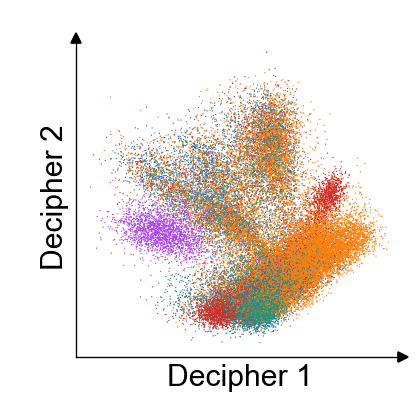

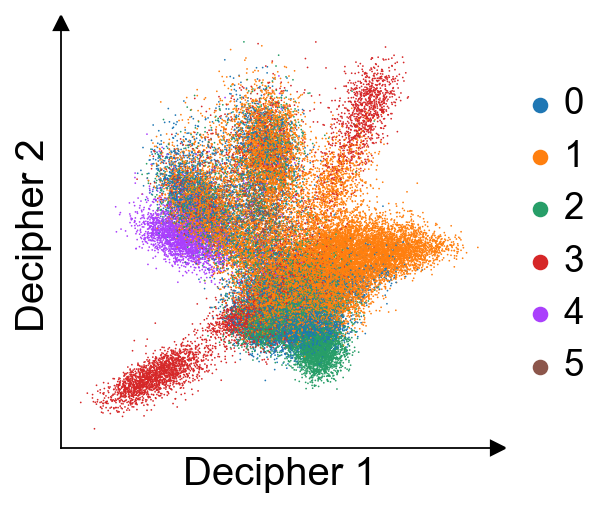

In [22]:
# Lower learning rate
from decipher.tools._decipher import DecipherConfig
decipher_config3 = DecipherConfig(learning_rate=1e-3, seed = 1)

# Train Decipher
d3, val3 = dc.tl.decipher_train(
    adata_balanced_dc, decipher_config3, 
    plot_kwargs={"color": "NUT-fusion"}, 
    plot_every_k_epochs=5,
)

2026-05-08 21:35:21,707 | INFO : Added `.obsm['decipher_v']`: the Decipher v space.
2026-05-08 21:35:21,708 | INFO : Added `.obsm['decipher_z']`: the Decipher z space.


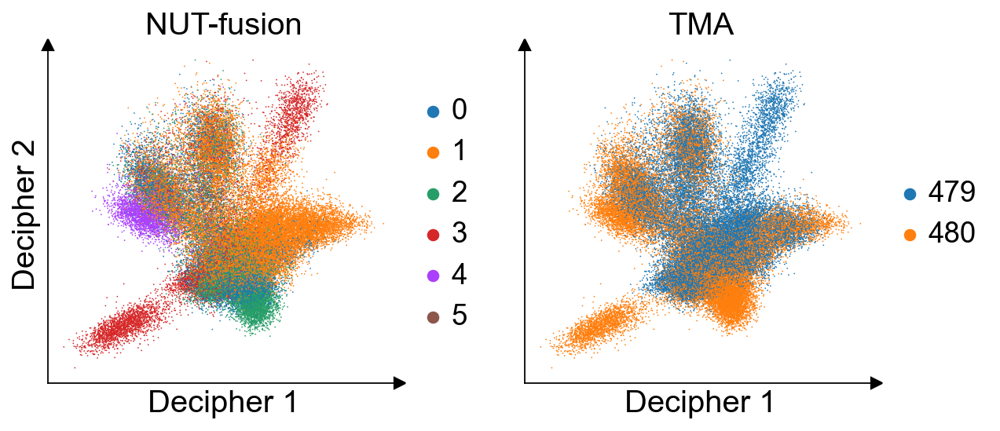

In [23]:
dc.tl.decipher_rotate_space(
    adata_balanced_dc,
    v1_col="NUT-fusion",
    v1_order=["0", "1", "2", "3", "4", "5"],
    v2_col="TMA",
    v2_order=["479", "480"],
)
# Decipher 1: ex_group, Decipher 2: TMA
dc.pl.decipher(adata_balanced_dc, ["NUT-fusion", "TMA"], palette=color_palette);

# biopsy site

In [68]:
adata_balanced_dc_biopsy = round_counts(adata_balanced)

# Ensure the 'decipher' key exists in the metadata
if "decipher" not in adata_balanced_dc_biopsy.uns:
    adata_balanced_dc_biopsy.uns["decipher"] = {}

## seed 1

Epoch 18 (batch 703/703) | | train elbo: 238.39 (last epoch: 238.31) | val ll: 253.21:   2%|▏         | 18/1000 [10:18<9:22:34, 34.37s/it]2026-05-08 14:10:35,797 | INFO : Early stopping has been triggered.
2026-05-08 14:10:36,367 | INFO : Added `.obsm['decipher_v']`: the Decipher v space.
2026-05-08 14:10:36,368 | INFO : Added `.obsm['decipher_z']`: the Decipher z space.
2026-05-08 14:10:36,369 | INFO : Saving decipher model with run_id 2026-05-08-14-10-36-abstract-glum-tartar.


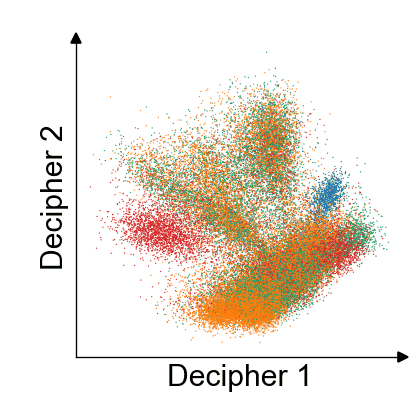

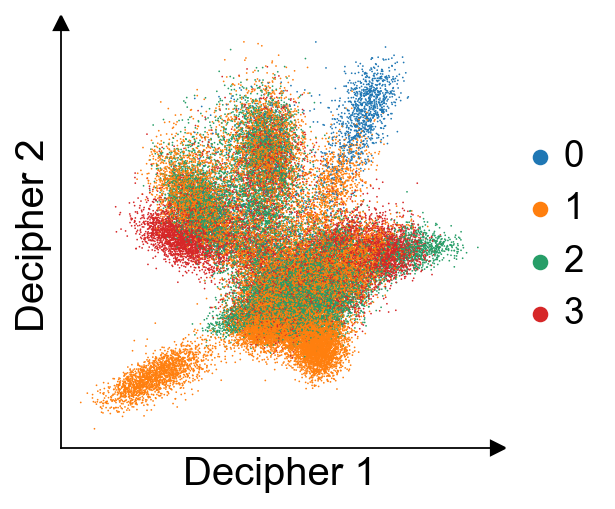

In [69]:
biopsy_config1 = DecipherConfig(learning_rate=1e-3, seed = 1)

# Train Decipher
biopsy_d1, biopsy_v1 = dc.tl.decipher_train(
    adata_balanced_dc_biopsy, biopsy_config1, 
    plot_kwargs={"color": "biopsy_site_classification"}, 
    plot_every_k_epochs=5,
)

adata_balanced_dc_biopsy.obsm['decipher_v_seed1'] = adata_balanced_dc_biopsy.obsm['decipher_v'].copy()

2026-05-08 14:14:22,156 | INFO : Added `.obsm['decipher_v']`: the Decipher v space.
2026-05-08 14:14:22,157 | INFO : Added `.obsm['decipher_z']`: the Decipher z space.


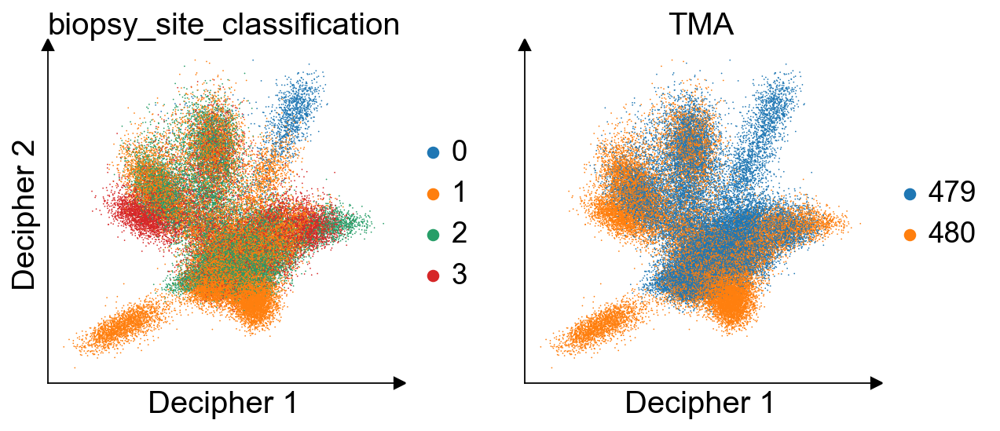

In [70]:
dc.tl.decipher_rotate_space(
    adata_balanced_dc_biopsy,
    v1_col="biopsy_site_classification",
    v1_order=["0", "1", "2", "3"],
    v2_col="TMA",
    v2_order=["479", "480"],
)
# Decipher 1: biopsy_site_classification, Decipher 2: TMA
dc.pl.decipher(adata_balanced_dc_biopsy, ["biopsy_site_classification", "TMA"], palette=color_palette);

# cell type general

In [10]:
adata_balanced_dc_celltype = round_counts(adata_balanced)

# Ensure the 'decipher' key exists in the metadata
if "decipher" not in adata_balanced_dc_celltype.uns:
    adata_balanced_dc_celltype.uns["decipher"] = {}

Epoch 18 (batch 703/703) | | train elbo: 238.39 (last epoch: 238.31) | val ll: 253.21:   2%|▏         | 18/1000 [06:11<5:37:36, 20.63s/it]2026-05-08 21:00:51,121 | INFO : Early stopping has been triggered.
2026-05-08 21:00:51,620 | INFO : Added `.obsm['decipher_v']`: the Decipher v space.
2026-05-08 21:00:51,621 | INFO : Added `.obsm['decipher_z']`: the Decipher z space.
2026-05-08 21:00:51,629 | INFO : Saving decipher model with run_id 2026-05-08-21-00-51-smoked-bisque-biscuit.


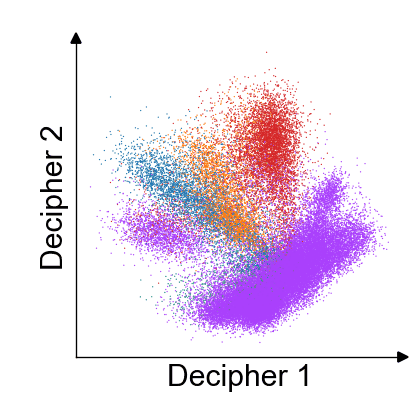

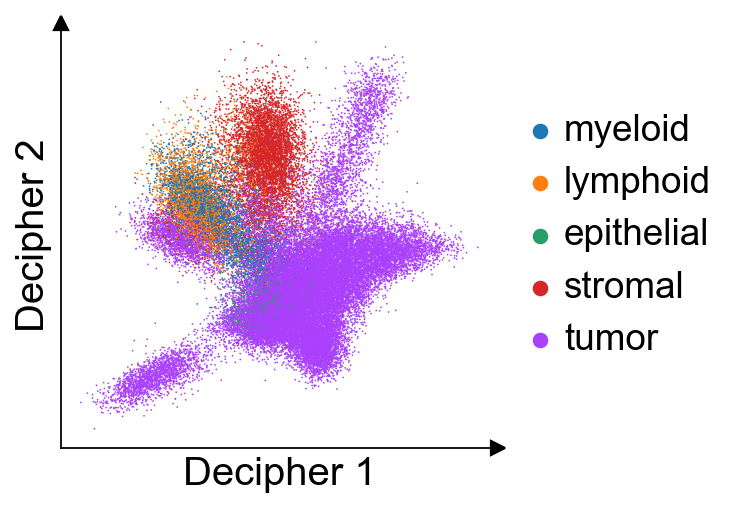

In [13]:
from decipher.tools._decipher import DecipherConfig
celltype_config1 = DecipherConfig(learning_rate=1e-3, seed = 1)

# Train Decipher
biopsy_d1, biopsy_v1 = dc.tl.decipher_train(
    adata_balanced_dc_celltype, celltype_config1, 
    plot_kwargs={"color": "cell_type_general"}, 
    plot_every_k_epochs=5,
)

adata_balanced_dc_celltype.obsm['decipher_v_seed1'] = adata_balanced_dc_celltype.obsm['decipher_v'].copy()

In [20]:
print(adata_balanced_dc_celltype.obs['cell_type_L1'].unique().tolist())

['endothelial', 'tumor', 'fibroblast', 'APC', 'epithelial', 'mixed_immune', 'mixed_stromal', 'mesenchymal', 'B Cell', 'T Cell', 'NK cell', 'neutrophil']


2026-05-08 21:16:19,995 | INFO : Added `.obsm['decipher_v']`: the Decipher v space.
2026-05-08 21:16:19,996 | INFO : Added `.obsm['decipher_z']`: the Decipher z space.


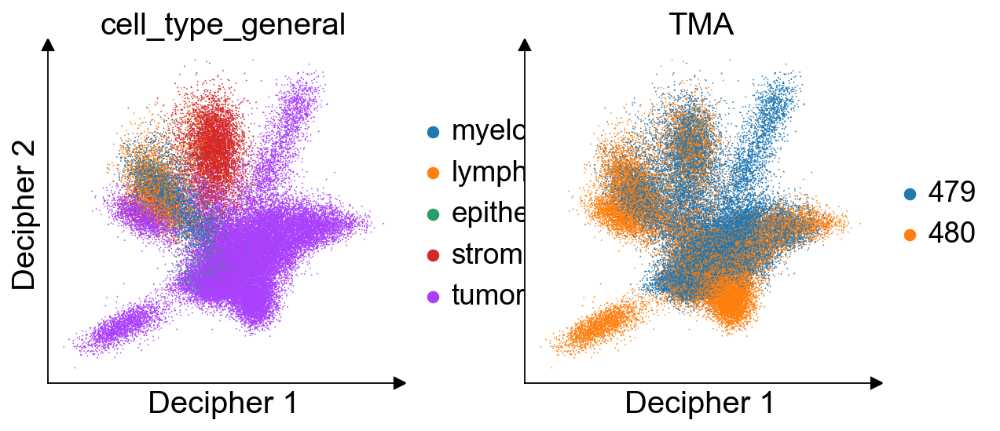

In [15]:
dc.tl.decipher_rotate_space(
    adata_balanced_dc_celltype,
    v1_col="cell_type_general",
    v1_order=["0", "1", "2", "3"],
    v2_col="TMA",
    v2_order=["479", "480"],
)
# Decipher 1: biopsy_site_classification, Decipher 2: TMA
dc.pl.decipher(adata_balanced_dc_celltype, ["cell_type_general", "TMA"], palette=color_palette);

Epoch 18 (batch 703/703) | | train elbo: 238.39 (last epoch: 238.31) | val ll: 253.21:   2%|▏         | 18/1000 [05:22<4:53:40, 17.94s/it]2026-05-08 21:28:03,431 | INFO : Early stopping has been triggered.
2026-05-08 21:28:03,926 | INFO : Added `.obsm['decipher_v']`: the Decipher v space.
2026-05-08 21:28:03,926 | INFO : Added `.obsm['decipher_z']`: the Decipher z space.
2026-05-08 21:28:03,927 | INFO : Saving decipher model with run_id 2026-05-08-21-28-03-dense-feldspar-negation.


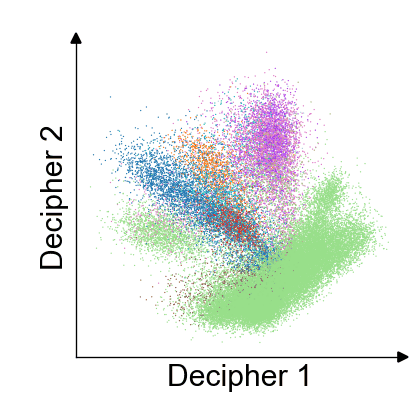

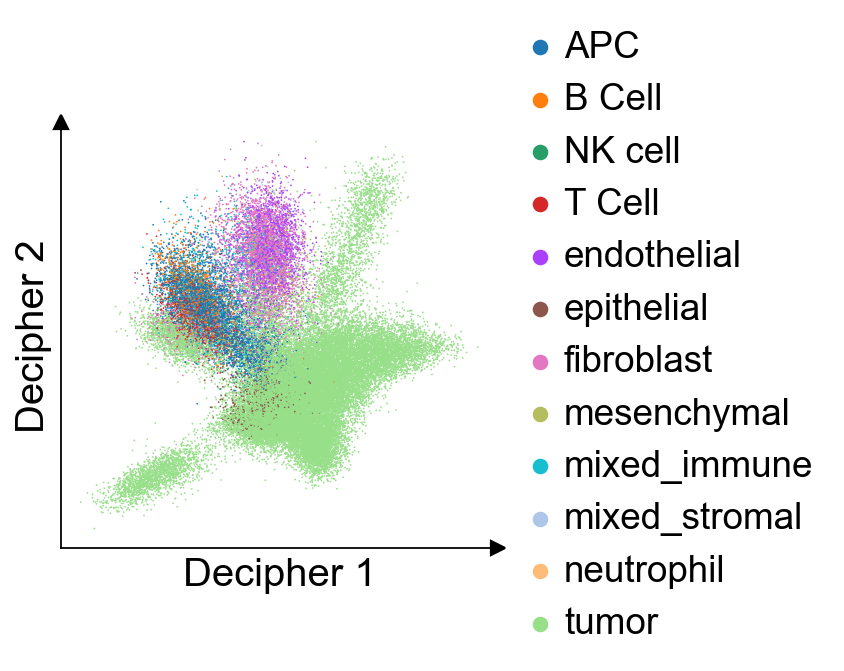

In [17]:
from decipher.tools._decipher import DecipherConfig
celltype_config2 = DecipherConfig(learning_rate=1e-3, seed = 1)

# Train Decipher
celltype_d1, celltype_v1 = dc.tl.decipher_train(
    adata_balanced_dc_celltype, celltype_config2, 
    plot_kwargs={"color": "cell_type_L1"}, 
    plot_every_k_epochs=5,
)

adata_balanced_dc_celltype.obsm['decipher_v_celltype_l1_seed1'] = adata_balanced_dc_celltype.obsm['decipher_v'].copy()

2026-05-08 21:29:02,128 | INFO : Added `.obsm['decipher_v']`: the Decipher v space.
2026-05-08 21:29:02,129 | INFO : Added `.obsm['decipher_z']`: the Decipher z space.


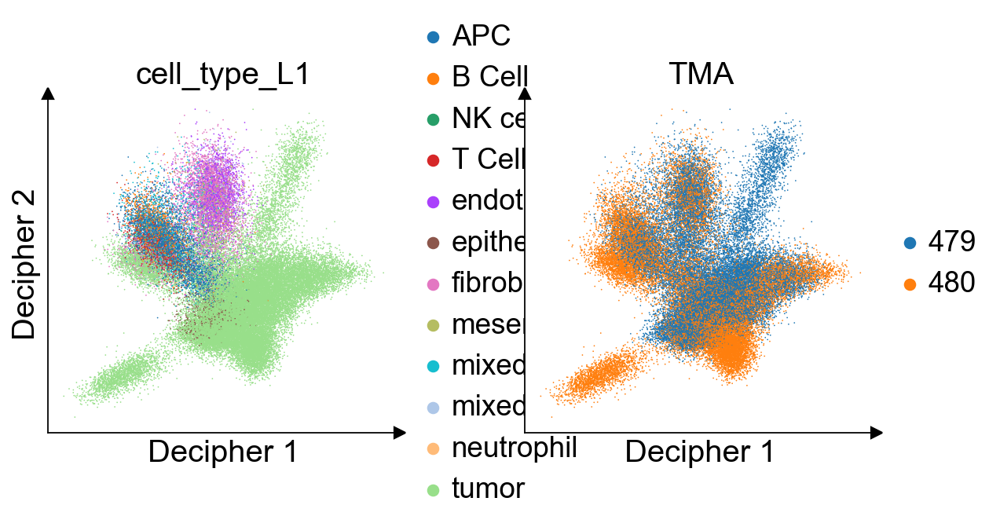

In [21]:
dc.tl.decipher_rotate_space(
    adata_balanced_dc_celltype,
    v1_col="cell_type_L1",
    v1_order=['endothelial', 'tumor', 'fibroblast', 'APC', 'epithelial', 'mixed_immune', 'mixed_stromal', 'mesenchymal', 'B Cell', 'T Cell', 'NK cell', 'neutrophil'],
    v2_col="TMA",
    v2_order=["479", "480"],
)
# Decipher 1: cell_type_L1, Decipher 2: TMA
dc.pl.decipher(adata_balanced_dc_celltype, ["cell_type_L1", "TMA"], palette=color_palette);

In [24]:
def myfunc(seed):
    name = f"decipher_v_{seed}"
    print(name)

myfunc(seed=1)

decipher_v_1


# silhouette score

## after PCA

In [7]:
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
 
from sklearn.metrics import silhouette_score
from scipy import stats
from scipy.stats import kruskal
import warnings
warnings.filterwarnings("ignore")

In [8]:
# ── 0. CONFIG ────────────────────────────────────────────────────────────────
#ADATA_PATH = "/Users/jihyunpark/Documents/Columbia/2026 Spring/Decipher Project/decipher-bc-condition-z-to-x/examples/adata_categories_edited.h5ad"
 
N_PCS = 50          # number of PCs to compute
TOP_PCS_FOR_SIL = 30  # PCs fed to silhouette calculation (first N)
#SAMPLE_N = 50_000   # cells to use (set None to use all; 50 k is the balanced subset)
RANDOM_STATE = 42
OUTPUT_PREFIX = "pca_analysis"   # prefix for saved figures
 

# Covariates to evaluate – ordered from "most technical" → "most biological"
COVARIATES = [
    "TMA",                   # ← key technical confounder
    "batch",                 # mirrors TMA (0/1)
    "sample_id",             # patient-level effect
    "ex_group",              # biological: Desert / Excluded / Inflamed
    "sample_type",           # margin vs tumor
    "NUT-fusion",            # biological: gene fusion partner
    "biopsy_site_classification",  # biological: biopsy site category
    "biopsy_site",
    "cell_type_general",     # cell-type composition (L0)
    "cell_type_L1",
    "treatment",
]
 
# ── 1. LOAD & PREPROCESS ──────────────────────────────────────────────────────
 
adata = adata_balanced_dc.copy()
# Normalise → log1p (skip if already done and stored in adata.X or layers)
# Detect if data looks raw (max count >> 1) vs already normalised
if adata.X.max() > 50:          # heuristic: raw counts will be large integers
    print("  Normalising and log-transforming …")
    sc.pp.normalize_total(adata, target_sum=1e4)
    sc.pp.log1p(adata)
else:
    print("  Data appears already normalised – skipping normalisation step.")
 
# ── 2. PCA ────────────────────────────────────────────────────────────────────
 
print(f"\nRunning PCA with {N_PCS} components …")
sc.tl.pca(adata, n_comps=N_PCS, svd_solver="arpack", random_state=RANDOM_STATE)
pca_coords = adata.obsm["X_pca"]          # (n_cells, N_PCS)
var_ratio   = adata.uns["pca"]["variance_ratio"]   # fraction explained per PC

  Normalising and log-transforming …

Running PCA with 50 components …


In [ ]:
import numpy as np

# Check the range of values
print(f"Max value: {adata_balanced_dc.X.max()}")
print(f"Mean value: {adata_balanced_dc.X.mean()}")

# Check if values are integers (Raw counts are integers; Log data is float)
is_integer = np.all(np.equal(np.mod(adata_balanced_dc.X[:100].toarray(), 1), 0))
print(f"Are the first 100 values integers? {is_integer}")

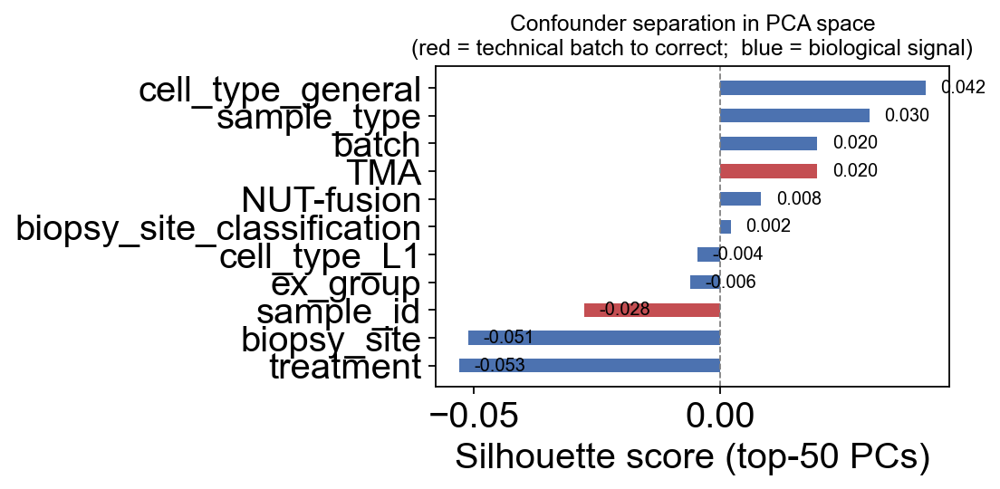

In [9]:
# ── PCA ───────────────────────────────────────────────────────────────────────
sc.tl.pca(adata, n_comps=N_PCS, svd_solver="arpack", random_state=RANDOM_STATE)
X_pca = adata.obsm["X_pca"][:, :N_PCS]

# ── Silhouette scores ─────────────────────────────────────────────────────────
present = [c for c in COVARIATES if c in adata.obs.columns]

scores, names = [], []
for cov in present:
    labels = adata.obs[cov].astype(str).values
    n_unique = len(np.unique(labels))
    if n_unique < 2 or n_unique >= len(labels):
        continue
    s = silhouette_score(
        X_pca, labels,
        metric="euclidean",
        sample_size=min(50000, len(labels)),
        random_state=RANDOM_STATE,
    )
    scores.append(round(s, 4))
    names.append(cov)

# Sort by score
order  = np.argsort(scores)
scores = [scores[i] for i in order]
names  = [names[i]  for i in order]

# Red = technical confounders to correct; blue = biological signal to preserve
TECHNICAL = {"TMA", "sample_id"}
colors = ["#C44E52" if n in TECHNICAL else "#4C72B0" for n in names]

# ── Plot ──────────────────────────────────────────────────────────────────────
plt.rcParams.update({"font.size": 11})
fig, ax = plt.subplots(figsize=(7, 3.5))

bars = ax.barh(names, scores, color=colors, edgecolor="none", height=0.5)
ax.axvline(0, color="gray", linewidth=0.8, linestyle="--")

# Value labels
for bar, val in zip(bars, scores):
    ax.text(val + 0.003, bar.get_y() + bar.get_height() / 2,
            f"{val:.3f}", va="center", fontsize=9)

ax.set_xlabel("Silhouette score (top-50 PCs)")
ax.set_title(
    "Confounder separation in PCA space\n"
    "(red = technical batch to correct;  blue = biological signal)",
    fontsize=11,
)
plt.tight_layout()
plt.savefig("pca_silhouette.png", dpi=150, bbox_inches="tight")
plt.show()

## after decipher

In [73]:
# Before choosing what to correct for, measure which covariates actually drive
# separation in the v-space. High silhouette = strong separation = bigger effect.

from sklearn.metrics import silhouette_score

v = adata_balanced_dc_biopsy.obsm["decipher_v"]

# Only score covariates with at least 2 unique values and no NaNs
covariates_to_score = {
    "TMA"   : adata_balanced_dc_biopsy.obs["TMA"].astype(str),
    "ex_group"    : adata_balanced_dc_biopsy.obs["ex_group"].astype(str),
    "sample_type" : adata_balanced_dc_biopsy.obs["sample_type"].astype(str),
    "sample_id" : adata_balanced_dc_biopsy.obs["sample_id"].astype(str),
    "cell_type_L1": adata_balanced_dc_biopsy.obs["cell_type_L1"].astype(str),
    "cell_type_general": adata_balanced_dc_biopsy.obs["cell_type_general"].astype(str),
    "NUT-fusion": adata_balanced_dc_biopsy.obs["NUT-fusion"].astype(str),
    "treatment_status": adata_balanced_dc_biopsy.obs["treatment_status"].astype(str),
    "biopsy_site" : adata_balanced_dc_biopsy.obs["biopsy_site"].astype(str),
    "biopsy_site_classification" : adata_balanced_dc_biopsy.obs["biopsy_site_classification"].astype(str),
}

print("\n── Silhouette scores in v-space (higher = stronger separation) ──────────")
silhouette_results = {}
for name, labels in covariates_to_score.items():
    # Drop NaN rows
    mask = labels != "nan"
    if labels[mask].nunique() < 2:
        print(f"  {name:<20} skipped (< 2 unique values)")
        continue
    score = silhouette_score(v[mask], labels[mask], sample_size=5000, random_state=42)
    silhouette_results[name] = score
    # flag = "  ← technical (correct)" if name in ["TMA_batch"] else \
    #        "  ← biological (preserve)" if name in ["ex_group", "biopsy_site", "cell_type_L1"] else ""
    #print(f"  {name:<25} silhouette = {score:.4f}{flag}")



── Silhouette scores in v-space (higher = stronger separation) ──────────


In [74]:
names  = list(silhouette_results.keys())
scores = list(silhouette_results.values())
batch = ["TMA", "sample_id"] # technical covariate(s) to correct for
colors = ["tomato" if n in batch else "steelblue" for n in names]
print(colors)

['tomato', 'steelblue', 'steelblue', 'tomato', 'steelblue', 'steelblue', 'steelblue', 'steelblue', 'steelblue', 'steelblue']


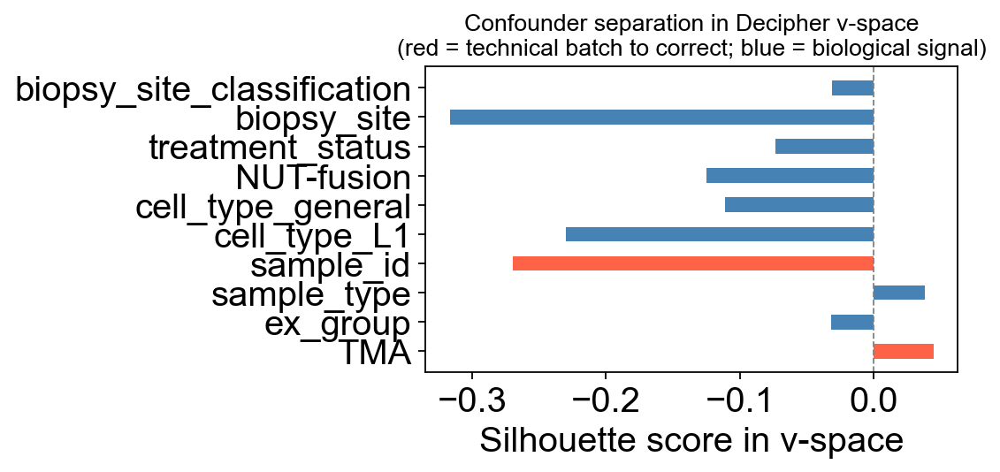

In [75]:
fig, ax = plt.subplots(figsize=(7, 3.5))
plt.rcParams.update({'font.size': 11})

bars = ax.barh(names, scores, color=colors, edgecolor="none", height=0.5)
ax.axvline(0, color="gray", linewidth=0.8, linestyle="--")
ax.set_xlabel("Silhouette score in v-space")
ax.set_title("Confounder separation in Decipher v-space\n"
             "(red = technical batch to correct; blue = biological signal)", fontsize=12)
plt.tight_layout()
plt.show()

2026-05-07 22:05:45,745 | INFO : Added `.obsm['decipher_v']`: the Decipher v space.
2026-05-07 22:05:45,747 | INFO : Added `.obsm['decipher_z']`: the Decipher z space.


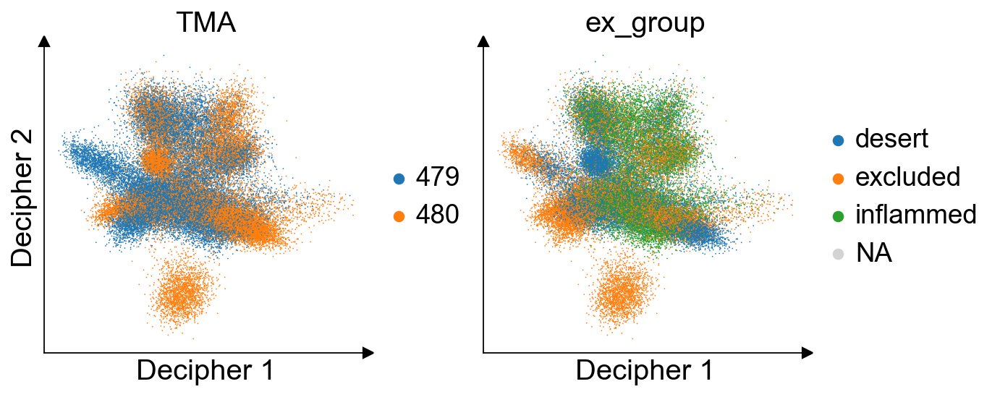

In [56]:
dc.tl.decipher_rotate_space(
    adata_balanced_dc1,
    v1_col="TMA",
    v1_order=["479", "480"],
    v2_col="ex_group",
    v2_order=["desert", "excluded", "inflammed", "NA"],
)
dc.pl.decipher(adata_balanced_dc1, ["TMA", "ex_group"], palette=color_palette);

In [ ]:
# Lower learning rate
from decipher.tools._decipher import DecipherConfig
decipher_config3 = DecipherConfig(learning_rate=1e-3, seed = 3)

# Train Decipher
d3, val3 = dc.tl.decipher_train(
    adata_balanced_dc1, decipher_config3, 
    plot_kwargs={"color": "NUT-fusion"}, 
    batch_key="TMA",
    plot_every_k_epochs=5,
)

Epoch 18 (batch 703/703) | | train elbo: 241.46 (last epoch: 241.46) | val ll: 252.35:   2%|▏         | 18/1000 [06:24<5:49:12, 21.34s/it]2026-04-28 20:07:12,170 | INFO : Early stopping has been triggered.
2026-04-28 20:07:12,705 | INFO : Added `.obsm['decipher_v']`: the Decipher v space.
2026-04-28 20:07:12,706 | INFO : Added `.obsm['decipher_z']`: the Decipher z space.
2026-04-28 20:07:12,707 | INFO : Saving decipher model with run_id 2026-04-28-20-07-12-magnetic-emerald-kinetic.


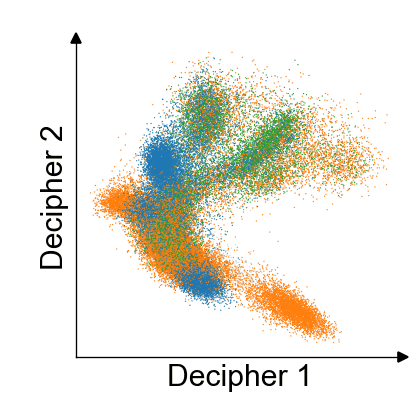

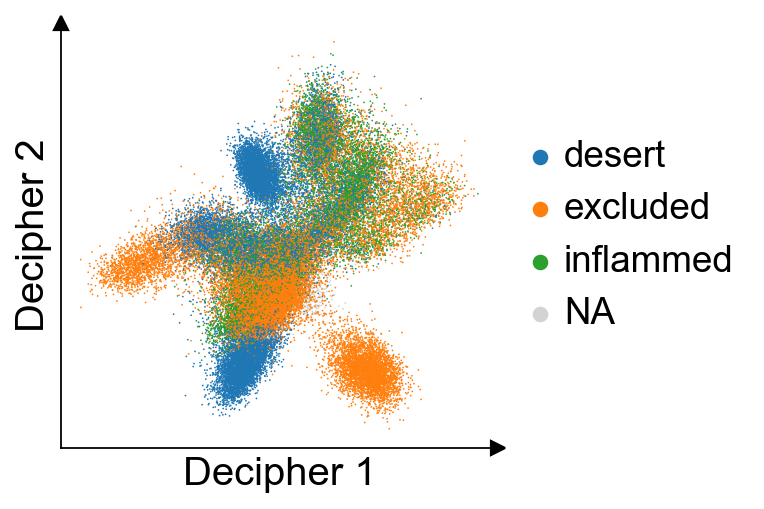

In [ ]:
# Train Decipher
d2, val2 = dc.tl.decipher_train(
    batch0_subset_dc, decipher_config, plot_kwargs={"color": "ex_group"}, plot_every_k_epochs=5,
)

Epoch 20 (batch 703/703) | | train elbo: 238.20 (last epoch: 238.24) | val ll: 252.83:   2%|▏         | 20/1000 [18:34<15:10:25, 55.74s/it]2026-04-29 12:25:55,683 | INFO : Early stopping has been triggered.
2026-04-29 12:25:56,276 | INFO : Added `.obsm['decipher_v']`: the Decipher v space.
2026-04-29 12:25:56,276 | INFO : Added `.obsm['decipher_z']`: the Decipher z space.
2026-04-29 12:25:56,278 | INFO : Saving decipher model with run_id 2026-04-29-12-25-56-parallel-silver-soup.


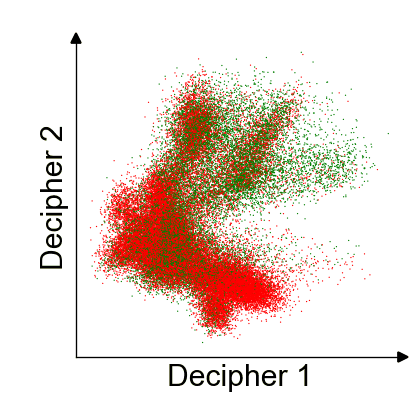

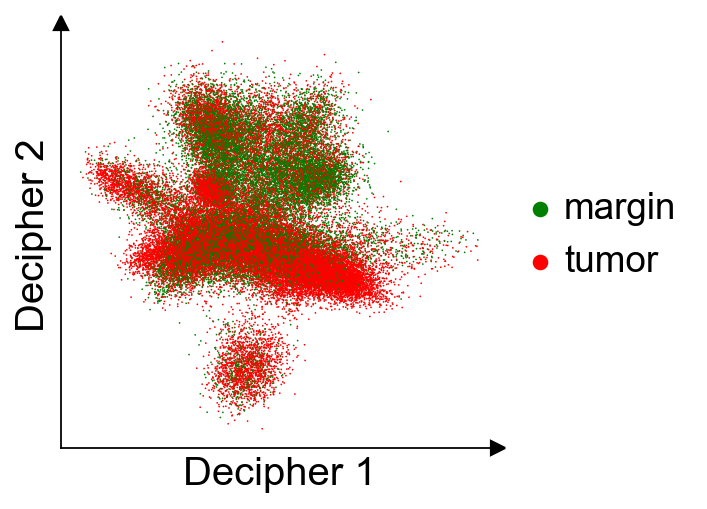

In [23]:
# Train Decipher
d3, val3 = dc.tl.decipher_train(
    adata_balanced_dc, decipher_config, plot_kwargs={"color": "sample_type"}, plot_every_k_epochs=5,
)

# Simulated Data

In [20]:
sim_path = '/Users/jihyunpark/Documents/Columbia/2026 Spring/Decipher Project/adata_combined_alpha_[0.01 0.05 0.1 ].h5ad'
simulated = sc.read_h5ad(sim_path)
simulated.uns["color_palette"] = None

In [21]:
simulated.obs.columns

Index(['latent_t', 'branch_id', 'cluster_true', 'latent_z0', 'latent_z1',
       'latent_z2', 'shift'],
      dtype='object')

### Rotate and flip the learned latent space to align it with the mechanisms of interest
We would ideally want `Decipher 1` to capture blast progression, and `Decipher 2` to discriminate `Healthy` and the AML sample.

2023-11-15 17:39:57,813 | INFO : Added `.obsm['decipher_v']`: the Decipher v space.
2023-11-15 17:39:57,813 | INFO : Added `.obsm['decipher_z']`: the Decipher z space.


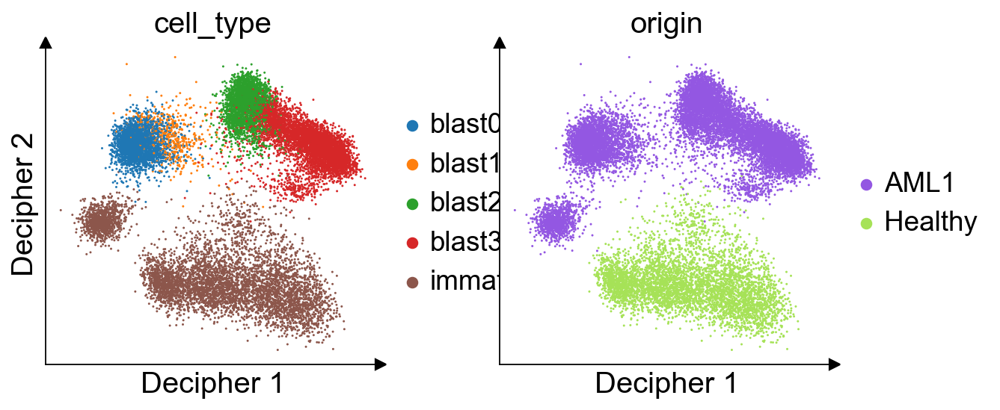

In [7]:
dc.tl.decipher_rotate_space(
    adata,
    v1_col="cell_type",
    v1_order=["blast0", "blast1", "blast2", "blast3"],
    v2_col="origin",
    v2_order=["Healthy", "AML1"],
)
dc.pl.decipher(adata, ["cell_type", "origin"], palette=color_palette);

### We now cluster the cells using the `decipher_z` representation, and compute trajectories.

2023-11-15 17:39:58,766 | INFO : Clustering cells using scanpy Leiden algorithm.
2023-11-15 17:39:58,767 | INFO : Step 1: Computing neighbors with `sc.pp.neighbors`, with the representation decipher_z.
2023-11-15 17:40:17,462 | INFO : Step 2: Computing clusters with `sc.tl.leiden`, and resolution 1.0.
2023-11-15 17:40:21,457 | INFO : Added `.obs['decipher_clusters']`: the cluster labels.


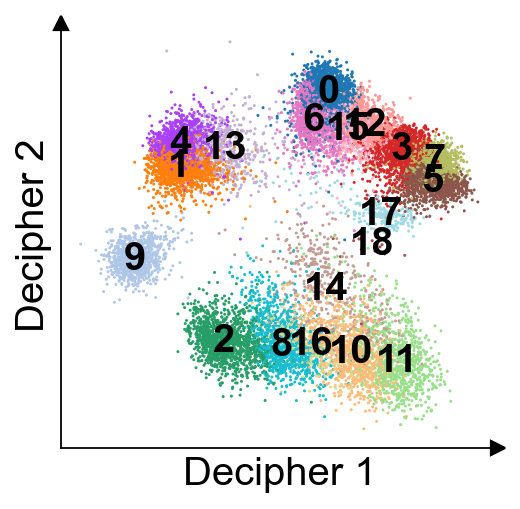

In [8]:
dc.tl.cell_clusters(adata)
dc.pl.decipher(adata, ["decipher_clusters"], legend_loc="on data");

2023-11-15 17:40:21,887 | INFO : Trajectory Healthy : ['2', '8', '16', '10', '11'])
2023-11-15 17:40:21,891 | INFO : Added trajectory Healthy to `adata.uns['decipher']['trajectories']`.
2023-11-15 17:40:21,998 | INFO : Trajectory AML1 : ['9', '1', '4', '13', '6', '15', '12', '3', '7', '5'])
2023-11-15 17:40:22,005 | INFO : Added trajectory AML1 to `adata.uns['decipher']['trajectories']`.


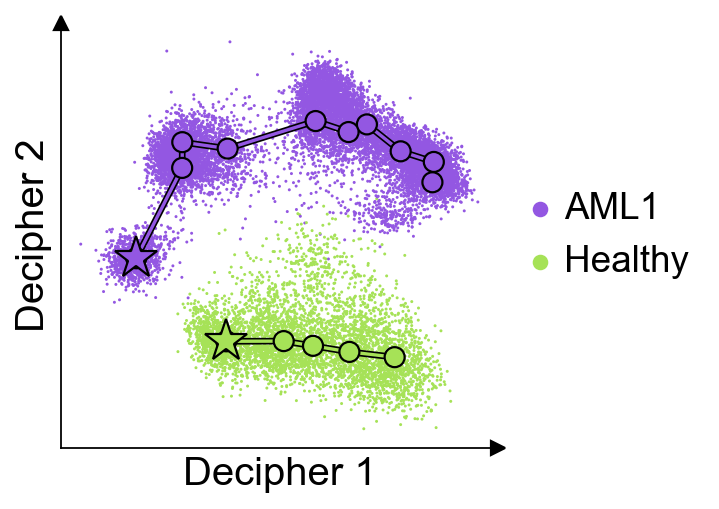

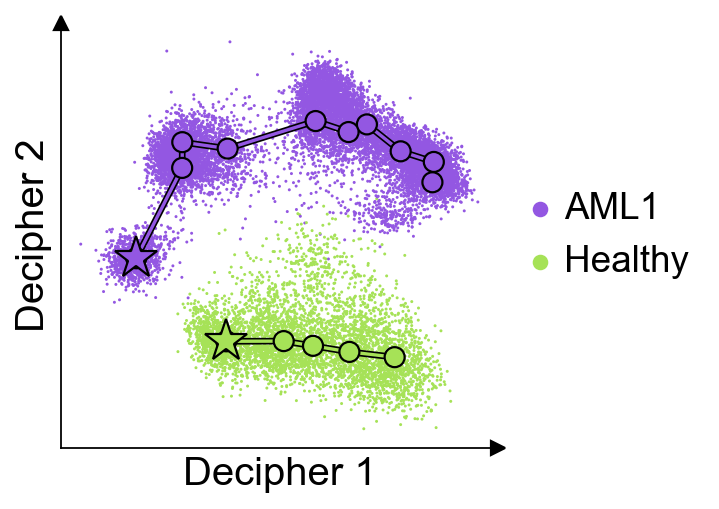

In [9]:
dc.tl.trajectories(
    adata,
    dc.tl.TConfig("Healthy", "AVP", "MPO", "origin", "Healthy"),
    dc.tl.TConfig("AML1", "AVP", "CD68", "origin", "AML1"),
)
dc.pl.trajectories(adata, "origin", palette=color_palette)

2023-11-15 17:40:22,530 | INFO : Added `.obs['decipher_time']`: the decipher time of each cell.


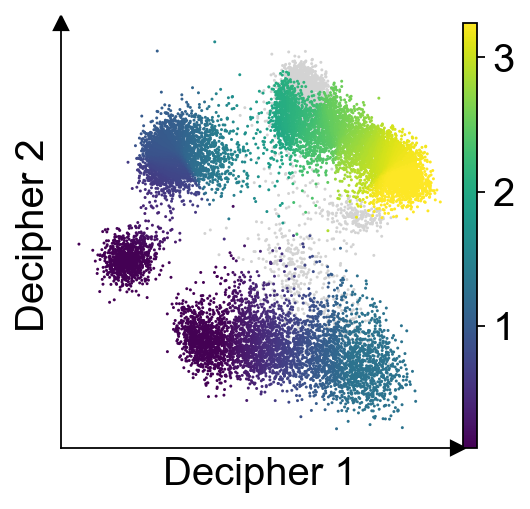

In [10]:
dc.tl.decipher_time(adata)
dc.pl.decipher_time(adata);

### Compute gene patterns

In [11]:
dc.tl.gene_patterns(adata)

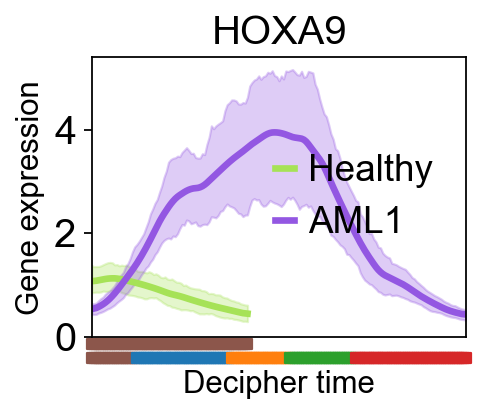

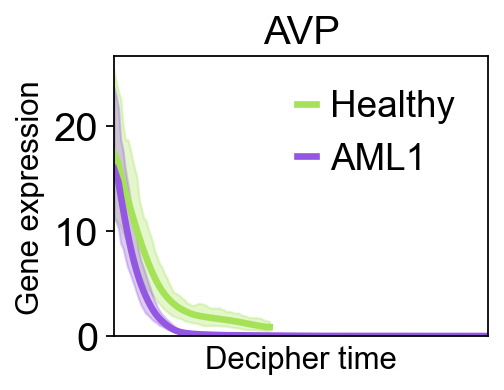

In [12]:
dc.pl.gene_patterns(adata, "HOXA9", palette=color_palette, cell_type_key="cell_type")
dc.pl.gene_patterns(adata, "AVP", palette=color_palette);

### Compute basis decomposition

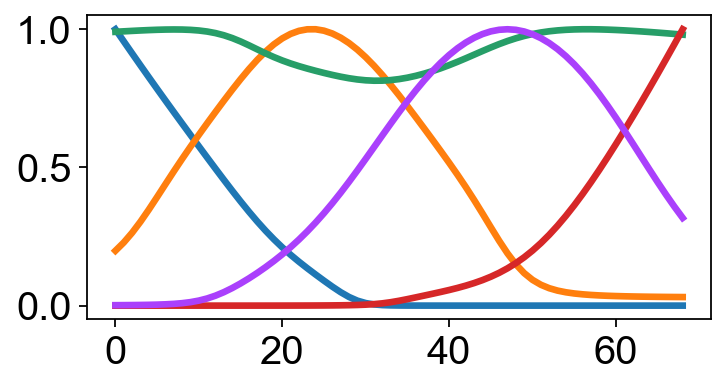

Loss: -966499.6 - Relative Error: 0.13%:  47%|███████████████████████████████████████████████▎                                                     | 4680/10000 [03:12<03:38, 24.31it/s]


In [13]:
training_losses = dc.tl.basis_decomposition(adata, seed=0);

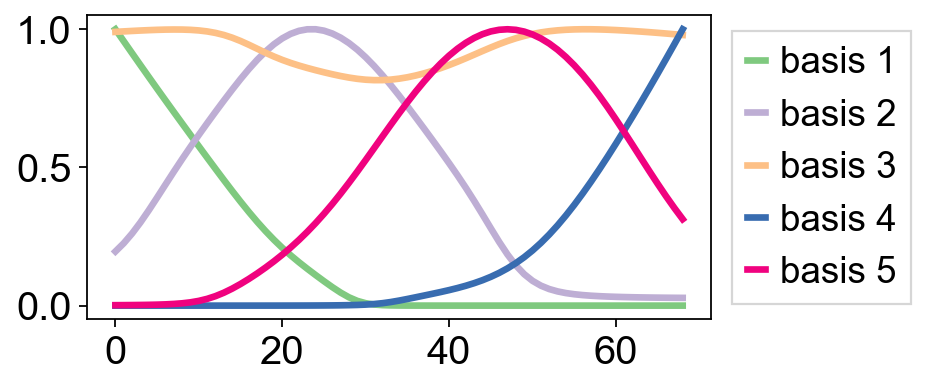

In [14]:
colors = [sns.color_palette("Accent")[i] for i in [0, 1, 2, 4, 5]]
dc.pl.basis(adata, colors=colors);

In [15]:
dc.tl.disruption_scores(adata)
adata.var[[c for c in adata.var if "decipher_disruption" in c]].sort_values(
    "decipher_disruption_combined", ascending=False
).head(10)

2023-11-15 17:43:38,551 | INFO : Added `.var['decipher_disruption_shape']`: shape disruption scores
2023-11-15 17:43:38,552 | INFO : Added `.var['decipher_disruption_scale']`: scale disruption scores
2023-11-15 17:43:38,552 | INFO : Added `.var['decipher_disruption_combined']`: combined disruption scores
2023-11-15 17:43:38,557 | INFO : Added `.uns['decipher']['disruption_scores']`: disruption scores
2023-11-15 17:43:38,558 | INFO : Added `.uns['decipher']['disruption_scores_samples']`: disruption scores probabilistic samples


,decipher_disruption_shape,decipher_disruption_scale,decipher_disruption_combined
index,,,
C1QTNF4,0.585618,2.450126,14.667301
DNTT,0.711000,5.786712,14.262213
CMTM8,0.341335,0.918616,12.359250
IGLL1,0.481286,2.751904,11.971736
UBE2C,0.674537,2.519647,11.882829
BIRC5,0.701430,2.449044,11.882485
RRM2,0.665228,2.000454,11.676637
MPO,0.132185,2.681761,11.662468
ICAM1,0.643572,3.076092,11.581854


## Other figures

In [16]:
plt.rcParams["figure.figsize"] = [3,3]

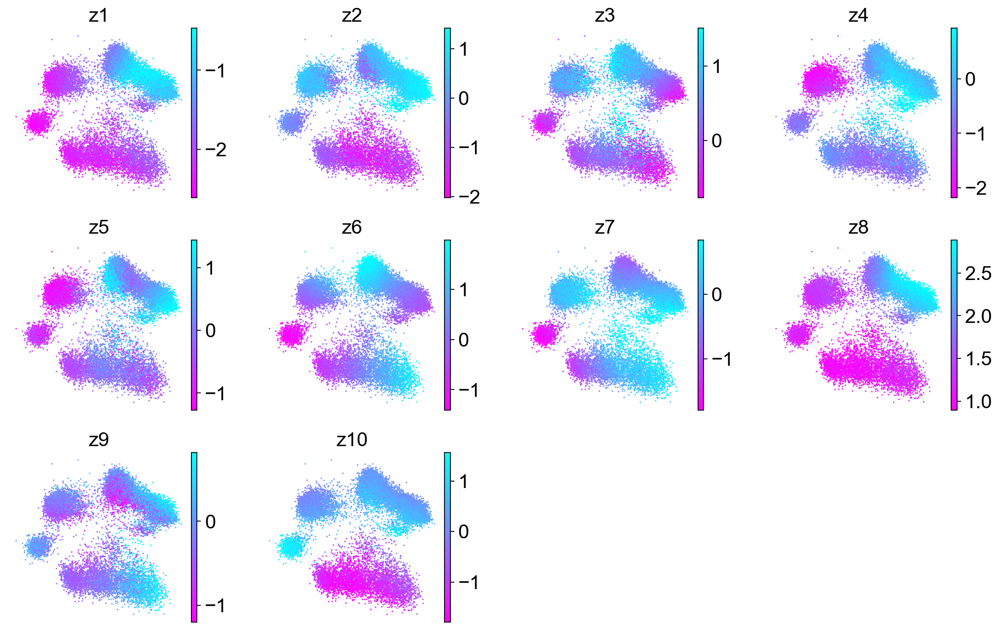

In [17]:
dc.pl.decipher_z(adata);

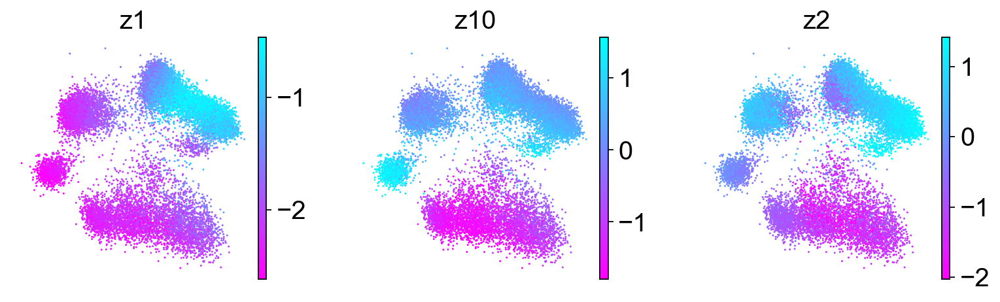

In [18]:
fig = dc.pl.decipher_z(adata, subset_of_zs=[1,10,2]);

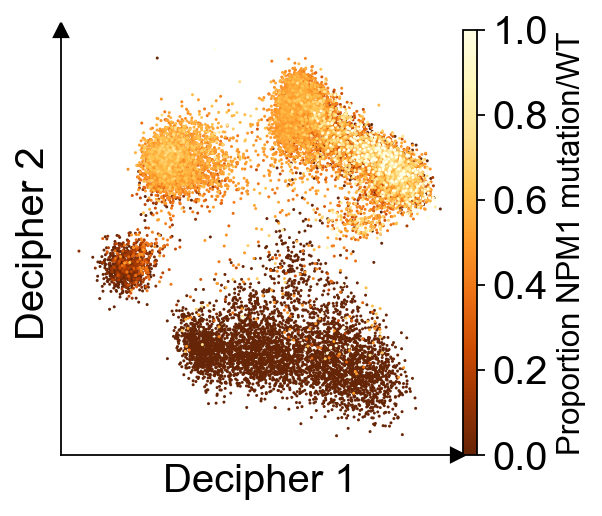

In [19]:
fig = dc.pl.decipher(adata, "NPM1 mutation vs wild type", cmap=sns.color_palette("YlOrBr_r", as_cmap=True, ))
fig.axes[0].collections[-1].colorbar.set_label("Proportion NPM1 mutation/WT", fontsize=14)


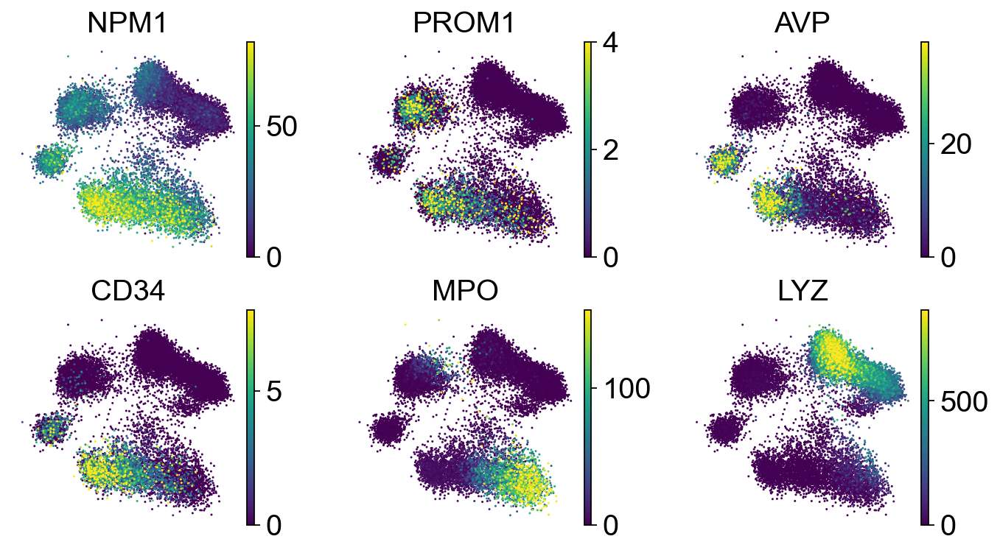

In [20]:
dc.pl.decipher(
    adata,
    ["NPM1", "PROM1", "AVP", "CD34", "MPO", "LYZ"],
    ncols=3,
    vmax=lambda x: np.quantile(x, 0.99),
    figsize=(2.5, 2.5),
    axis_type=None
);